# Evaluation de l'UE Prog

*Auguste Gardette et Judith Coutrot*

AgroParisTech - IODAA 

## Jeu de données : Classification d'Images - Pneumonia detection on chest X-ray

Travail d'évaluation de l'UE programmation dont le but est de mettre en avant:

- Différentes tâches supervisées: classification, régression
- Optimisation des performances (sélection de modèles, de caractéristiques, optimisation des pré-traitement)
- Présentation des performances de référence par rapport aux performances optimisées
- Modèles scikit-learn + approches deep-learning

Données issues du site Kaggle (https://www.kaggle.com/datasets/paultimothymooney/chest-xray-pneumonia)

### Préambule

In [5]:
import matplotlib.pyplot as plt
from matplotlib.image import imread
import numpy as np
import sklearn
import pandas as pd
import seaborn
import cv2
import random
from tqdm import tqdm
from sklearn.metrics import confusion_matrix
from mlxtend.plotting import plot_confusion_matrix

In [6]:
import torch
from torch.utils.data import TensorDataset, DataLoader
from tensorboard import notebook

from torch.utils.tensorboard import SummaryWriter
import time
import os

TB_PATH = "C:/Users/judit/OneDrive/Documents/IODAA_progra/pytorch/tmp/logs/module2"
PATH = "C:/Users/judit/OneDrive/Documents/IODAA_progra/pytorch/modelesPneumonia4/"

use_cuda = torch.cuda.is_available()
print("La version de torch est : ",torch.__version__)
print("Le calcul GPU est disponible ? ", use_cuda)
device = torch.device("cuda" if use_cuda else "cpu")
print(device)

La version de torch est :  2.0.0+cpu
Le calcul GPU est disponible ?  False
cpu


In [7]:
import torchvision.transforms as transforms
from torchvision.datasets import ImageFolder
from torch import nn
from torch.nn import functional as F
from torch import optim
from torch.utils.data import WeightedRandomSampler
from torchsummary import summary

### 1. Introduction des données

#### Introduction et chargement des données

Le jeu de données sur lequel nous avons choisi de travailler porte sur la détection de pneumonie, une maladie inflammatoire des poumons causée principalement par une infection virale ou bactérienne, qui provoque des symptômes tels qu'une toux, des douleurs thoraciques, de la fièvre et des difficultés respiratoires. Le travail suivant porte sur un dataset de radiographie à rayon X de Kaggle récoltées dans des études de cohortes rétrospectives de patients pédiatriques.

> <span style="color:green"> Le but du travail présenté est donc de produire un modèle de classification (binaire) capable de prédire si une image correspond à un patient atteint de pneumonie ou non. Pour ce faire, nous nous tournons vers du deep learning avec un **réseau de neurones à convolution.**</span>

In [8]:
#Differents dossiers composants le jeu de donnees
data_dir = 'chest_xray/chest_xray'

print(os.listdir(data_dir))
classes = os.listdir(data_dir + "/train")
print(classes)

['.DS_Store', 'test', 'train', 'val']
['.DS_Store', 'NORMAL', 'PNEUMONIA']


Les données sont déjà reparties en différents ensembles d'entrainement, de validation et de test. Les images sont réparties pour chaque ensemble selon deux dossiers indiquant leur classe : `Normal` et `Pneumonia`.

In [9]:
#Affichage des données
pneumonia_files = os.listdir(data_dir + "/train/PNEUMONIA")
print("Nombre d'exemples de pneumonie (Pneumonia):", len(pneumonia_files))
print(pneumonia_files[1:5])

normal_files = os.listdir(data_dir + "/train/NORMAL")
print("Nombre d'exemples sains (Normal):", len(normal_files))
print(normal_files[1:5])

Nombre d'exemples de pneumonie (Pneumonia): 3876
['person1000_bacteria_2931.jpeg', 'person1000_virus_1681.jpeg', 'person1001_bacteria_2932.jpeg', 'person1002_bacteria_2933.jpeg']
Nombre d'exemples sains (Normal): 1342
['IM-0115-0001.jpeg', 'IM-0117-0001.jpeg', 'IM-0119-0001.jpeg', 'IM-0122-0001.jpeg']


In [10]:
trans = transforms.Compose([transforms.Resize(255),
                            transforms.CenterCrop(224),
                            transforms.ToTensor()])
dataset_train = ImageFolder(data_dir+'/train', trans)
dataset_train

Dataset ImageFolder
    Number of datapoints: 5216
    Root location: chest_xray/chest_xray/train
    StandardTransform
Transform: Compose(
               Resize(size=255, interpolation=bilinear, max_size=None, antialias=warn)
               CenterCrop(size=(224, 224))
               ToTensor()
           )

#### Visualisation des données

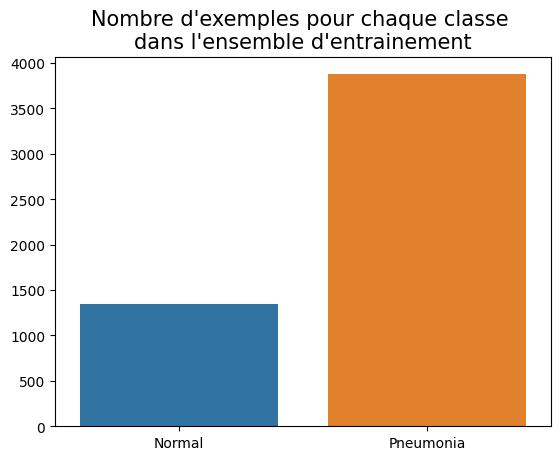

In [11]:
#Barplot de la répartition des classes
train_samplesize = pd.DataFrame.from_dict(
    {'Normal': [len([os.path.join(data_dir+'/train/NORMAL', filename) 
                     for filename in os.listdir(data_dir+'/train/NORMAL')])], 
     'Pneumonia': [len([os.path.join(data_dir+'/train/PNEUMONIA', filename) 
                        for filename in os.listdir(data_dir+'/train/PNEUMONIA')])]})


seaborn.barplot(data=train_samplesize).set_title("Nombre d'exemples pour chaque classe \ndans l'ensemble d'entrainement", fontsize=15)
plt.show()

> <span style="color:green"> Nous observons un désequilibre de représentation des classes avec un surreprésentation d'exemples de `pneumonie`. Ce déséquilibre peut être un biais lors de l'apprentissage. Nous pourrons essayer de prendre en compte ce déséquilibre par la suite, en surpondérant les instances de la classe `Normal` par exemple. </span>


In [12]:
#Plot d'un echantillon d'exemples (fonction)
def plot_samples(samples):  
    fig, ax = plt.subplots(nrows=2, ncols=5, figsize=(30,8))
    for i in range(len(samples)):
        image = cv2.cvtColor(imread(samples[i]), cv2.COLOR_BGR2RGB)
        ax[i//5][i%5].imshow(image)
        if i<5:
            ax[i//5][i%5].set_title("Normal", fontsize=20)
        else:
            ax[i//5][i%5].set_title("Pneumonia", fontsize=20)
        ax[i//5][i%5].axis('off')

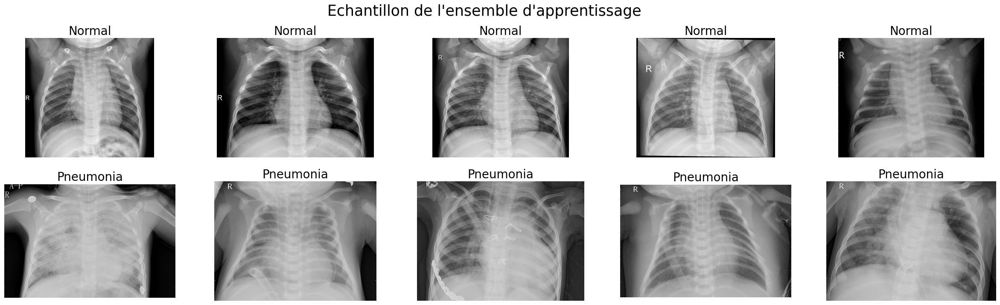

In [13]:
#Plot un echantillon de l'ensemble d'apprentissage
rand_samples = random.sample([os.path.join(data_dir+'/train/NORMAL', filename) 
                              for filename in os.listdir(data_dir+'/train/NORMAL')], 5) + \
    random.sample([os.path.join(data_dir+'/train/PNEUMONIA', filename) 
                   for filename in os.listdir(data_dir+'/train/PNEUMONIA')], 5)

plot_samples(rand_samples)
plt.suptitle("Echantillon de l'ensemble d'apprentissage", fontsize=25)
plt.show()

#### Mise en forme des données d'entrainement, de validation et de test

> <span style="color:green"> Dans un premier temps, nous nous interessons aux données telles quelles. Elles sont réparties en 3 groupes : d'entrainement (5216 exemples), de test (624 exemples) et de validation (16 exemples). Les données de test serviront à choisir le meilleurs modèle et les données de validation nous permettront de faire nos conclusions. </span>

In [14]:
#Validation et Test
trans = transforms.Compose([transforms.Resize(255),
                            transforms.CenterCrop(224),
                            transforms.ToTensor()])
dataset_val = ImageFolder(data_dir+'/val', trans)
dataset_test = ImageFolder(data_dir+'/test', trans)
print(len(dataset_train))
print(len(dataset_test))
print(len(dataset_val))
dataset_train

5216
624
16


Dataset ImageFolder
    Number of datapoints: 5216
    Root location: chest_xray/chest_xray/train
    StandardTransform
Transform: Compose(
               Resize(size=255, interpolation=bilinear, max_size=None, antialias=warn)
               CenterCrop(size=(224, 224))
               ToTensor()
           )

In [15]:
#Dataloader
BATCH_SIZE = 64

train_dl = DataLoader(dataset_train, BATCH_SIZE, shuffle=True)
test_dl = DataLoader(dataset_test, BATCH_SIZE, shuffle=True)
val_dl = DataLoader(dataset_val, BATCH_SIZE)

#### Amélioration possible des prétraitements des données

Dans un objectif de comparaison de différents prétraitements possibles nous avons modifié nos données notamment avec de 'l'augmentation de données'. Tout d'abord nous avons redimmensionné et recadré les images (224x224) car de nombreuses images sont de tailles différentes. 

> <span style="color:green"> Pour augmenter les données, on a effectué un retournement horizontal aléatoire, une rotation aléatoire et un changement niveaux de gris aléatoires pour **augmenter la diversité** des données disponibles pour entraîner le modèle.</span>

In [16]:
trans2 = transforms.Compose([transforms.Resize(255),
                             transforms.CenterCrop(224),
                             transforms.RandomHorizontalFlip(),
                             transforms.RandomRotation(10),
                             transforms.RandomGrayscale(),
                             transforms.RandomAffine(translate=(0.05,0.05), degrees=0),
                             transforms.ToTensor()])
dataset_train2 = ImageFolder(data_dir+'/train', trans2)
dataset_val2 = ImageFolder(data_dir+'/val', trans2)
dataset_test2 = ImageFolder(data_dir+'/test', trans2)
dataset_train2

Dataset ImageFolder
    Number of datapoints: 5216
    Root location: chest_xray/chest_xray/train
    StandardTransform
Transform: Compose(
               Resize(size=255, interpolation=bilinear, max_size=None, antialias=warn)
               CenterCrop(size=(224, 224))
               RandomHorizontalFlip(p=0.5)
               RandomRotation(degrees=[-10.0, 10.0], interpolation=nearest, expand=False, fill=0)
               RandomGrayscale(p=0.1)
               RandomAffine(degrees=[0.0, 0.0], translate=(0.05, 0.05))
               ToTensor()
           )

> <span style="color:green"> Dans ce jeu de données modifié nous avons aussi **surpondéré** la classe `Normal` (pour être cohérent avec le rapport entre les deux classes) qui, comme nous l'avons vu dans l'histogramme, était sous-représenté .</span>

In [17]:
BATCH_SIZE_2 = 64

# Accéder aux labels des images dans le dataset
classes = dataset_train2.classes
class_to_idx = dataset_train2.class_to_idx
labels = [classes[idx] for idx in dataset_train2.targets]

# créer des poids pour chaque échantillon
weights_train = [0.72 if l == 'NORMAL' else 0.28 for l in labels]

# créer une pondération pour suréchantillonner la classe minoritaire : Normal
sampler = WeightedRandomSampler(weights_train, len(weights_train))

batch_sampler = torch.utils.data.BatchSampler(sampler, batch_size=BATCH_SIZE_2, drop_last=True)

In [18]:
#Dataloader

train_dl2 = DataLoader(dataset_train2, batch_sampler=batch_sampler)
test_dl2 = DataLoader(dataset_test2, BATCH_SIZE_2)
val_dl2 = DataLoader(dataset_val2, BATCH_SIZE_2)

> <span style="color:green"> Enfin, dans un troisième temps, nous avons créé un dernier jeu de données, modifié de la même manière que le précédent, avec une normalisation sur chaque canal de couleur pour éviter qu'une couleur ait une importance particulière pendant l'entrainement. </span>

In [19]:
trans3 = transforms.Compose([transforms.Resize(255),
                             transforms.CenterCrop(224),
                             transforms.RandomHorizontalFlip(),
                             transforms.RandomRotation(10),
                             transforms.RandomGrayscale(),
                             transforms.RandomAffine(translate=(0.05,0.05), degrees=0),
                             transforms.ToTensor(),
                             transforms.Normalize(mean=[0.485, 0.456, 0.406], 
                                                 std=[0.229, 0.224, 0.225] ,inplace=True)])
dataset_train3 = ImageFolder(data_dir+'/train', trans3)
dataset_val3 = ImageFolder(data_dir+'/val', trans3)
dataset_test3 = ImageFolder(data_dir+'/test', trans3)

In [20]:
train_dl3 = DataLoader(dataset_train3, batch_sampler=batch_sampler)
test_dl3 = DataLoader(dataset_test3, BATCH_SIZE_2)
val_dl3 = DataLoader(dataset_val3, BATCH_SIZE_2)

Pour résumer, nous avons  jeux de données pré-traités différemment :

- Un jeu de données **sans prétraitement** (-)

- Un jeu de données **recadré** et **augmenté** (2)

- Et enfin, un jeu de données **recadré**, **augmenté** et **normalisé** (3)

### 2. Modèle

#### Création du modèle


In [21]:
def accuracy(yhat,y):
    # y encode les indexes, s'assurer de la bonne taille de tenseur
    assert len(y.shape)==1 or y.size(1)==1
    return (torch.argmax(yhat,1).view(y.size(0),-1)== y.view(-1,1)).double().mean()
    
def train(model,epochs,train_loader,test_loader):
    writer = SummaryWriter(f"{TB_PATH}/{model.name}")
    optim = torch.optim.Adam(model.parameters(),lr=1e-3)    # choix optimizer
    model = model.to(device)
    history_train_loss = []
    history_test_loss = []
    history_train_acc = []
    history_test_acc = []
    print(f"running {model.name}")
    loss = nn.CrossEntropyLoss()                            # choix loss
    for epoch in tqdm(range(epochs)):
        print(f"Epoch {epoch} :")
        cumloss, cumacc, count = 0, 0, 0
        model.train()
        for x,y in train_loader:                            # boucle sur les batchs
            optim.zero_grad()
            x,y = x.to(device), y.to(device)                # y doit être un tensor (pas un int)
            yhat = model(x)
            l = loss(yhat,y)
            l.backward()
            optim.step()
            cumloss += l*len(x)                             # attention, il peut y avoir un batch + petit (le dernier)
            cumacc += accuracy(yhat,y)*len(x)
            count += len(x)
        writer.add_scalar('loss/train',cumloss/count,epoch)
        writer.add_scalar('accuracy/train',cumacc/count,epoch)
        print(f"TRAIN -    Loss {cumloss/count},      Accuracy {cumacc/count} ")
        history_train_loss.append(cumloss/count)
        history_train_acc.append(cumacc/count)
        if epoch % 1 == 0:
            model.eval()
            with torch.no_grad():
                cumloss, cumacc, count = 0, 0, 0
                for x,y in test_loader:
                    x,y = x.to(device), y.to(device)
                    yhat = model(x)
                    cumloss += loss(yhat,y)*len(x)
                    cumacc += accuracy(yhat,y)*len(x)
                    count += len(x)
                writer.add_scalar(f'loss/test',cumloss/count,epoch)
                writer.add_scalar('accuracy/test',cumacc/count,epoch)
                print(f"TEST -    Loss {cumloss/count},      Accuracy {cumacc/count} ")
                history_test_loss.append(cumloss/count)
                history_test_acc.append(cumacc/count)
    return history_train_loss, history_train_acc, history_test_loss, history_test_acc

In [22]:
class ConvNet(nn.Module):

    def __init__(self,pooling = nn.MaxPool2d): # argument sur le pooling
        super().__init__()
        # Convolution 
        self.conv1 = nn.Conv2d(in_channels=3, out_channels=16, kernel_size=3, padding=1)
        # Max pooling
        self.pool1 = pooling(kernel_size=2, stride=2)
        # Convolution 
        self.conv2 = nn.Conv2d(in_channels=16, out_channels=32, kernel_size=3, padding=1)
        # Max pooling 
        self.pool2 = pooling(kernel_size=2, stride=2)
        #initialisation des poids pour éviter des problèmes de gradient
        torch.nn.init.xavier_uniform_(self.conv1.weight)
        torch.nn.init.xavier_uniform_(self.conv2.weight)

        self.size = 32*56*56
        self.lin1 = nn.Linear(self.size, 120)
        self.lin2 = nn.Linear(120, 2)
        
        self.features   = nn.Sequential(self.conv1,nn.ReLU(),self.pool1,self.conv2,nn.ReLU(),self.pool2)
        self.classifier = nn.Sequential(self.lin1,nn.ReLU(),self.lin2)
        
    def forward(self, x):
        x = self.features(x)
        x = self.classifier(x.view(-1, self.size))
        return x
    
convnet=ConvNet().to(device)
convnet.name="1stConv-"+ time.asctime().replace(' ', '_').replace(':', '-')
convnet_avg = ConvNet(nn.AvgPool2d).to(device)
convnet_avg.name="1stConv-pool-"+ time.asctime().replace(' ', '_').replace(':', '-')


Le modèle est composé de deux couches de convolution, chacune suivie d'une couche de mise en commun, suivies de deux couches linéaires entièrement connectées. Les couches de convolution extraient des caractéristiques importantes des images, tandis que les couches entièrement connectées effectuent la classification finale.

#### Entrainement du modèle

> <span style="color:green"> Le modèle est entrainé dans un premier temps avec les données sans prétraitement. </span>

En réalité, en premier lieu, deux modèles sont entrainés. L'un avec un *average pooling* en plus.

In [23]:
EPOCH = 20

%load_ext tensorboard
%tensorboard --logdir {TB_PATH}

notebook.display()

tensor_conv = train(convnet,     EPOCH, train_dl, test_dl)
tensor_conv_avg = train(convnet_avg, EPOCH, train_dl, test_dl)

Selecting TensorBoard with logdir C:/Users/judit/OneDrive/Documents/IODAA_progra/pytorch/tmp/logs/module2 (started 4 days, 19:48:11 ago; port 6006, pid 18588).


running 1stConv-Sat_Apr_15_12-43-36_2023


  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 0 :
TRAIN -    Loss 0.3788784444332123,      Accuracy 0.8625383435582822 


  5%|▌         | 1/20 [03:41<1:10:14, 221.83s/it]

TEST -    Loss 0.6529843807220459,      Accuracy 0.7628205128205128 
Epoch 1 :
TRAIN -    Loss 0.15059280395507812,      Accuracy 0.9399923312883436 


 10%|█         | 2/20 [07:00<1:02:25, 208.07s/it]

TEST -    Loss 1.0484619140625,      Accuracy 0.7371794871794872 
Epoch 2 :
TRAIN -    Loss 0.12487954646348953,      Accuracy 0.9513036809815951 


 15%|█▌        | 3/20 [10:07<56:14, 198.49s/it]  

TEST -    Loss 0.9144802689552307,      Accuracy 0.7371794871794872 
Epoch 3 :
TRAIN -    Loss 0.11325723677873611,      Accuracy 0.9560966257668712 


 20%|██        | 4/20 [13:13<51:35, 193.47s/it]

TEST -    Loss 1.0375186204910278,      Accuracy 0.7708333333333334 
Epoch 4 :
TRAIN -    Loss 0.08840098977088928,      Accuracy 0.96875 


 25%|██▌       | 5/20 [16:21<47:56, 191.77s/it]

TEST -    Loss 1.242829442024231,      Accuracy 0.7692307692307693 
Epoch 5 :
TRAIN -    Loss 0.07988712936639786,      Accuracy 0.9704754601226994 


 30%|███       | 6/20 [19:30<44:30, 190.74s/it]

TEST -    Loss 0.9459185600280762,      Accuracy 0.7612179487179487 
Epoch 6 :
TRAIN -    Loss 0.0756848081946373,      Accuracy 0.9739263803680982 


 35%|███▌      | 7/20 [22:34<40:51, 188.61s/it]

TEST -    Loss 1.157976746559143,      Accuracy 0.7580128205128205 
Epoch 7 :
TRAIN -    Loss 0.053693126887083054,      Accuracy 0.9817868098159509 


 40%|████      | 8/20 [25:44<37:48, 189.04s/it]

TEST -    Loss 0.9557591080665588,      Accuracy 0.7884615384615384 
Epoch 8 :
TRAIN -    Loss 0.07617152482271194,      Accuracy 0.9720092024539877 


 45%|████▌     | 9/20 [29:01<35:06, 191.50s/it]

TEST -    Loss 1.2607899904251099,      Accuracy 0.782051282051282 
Epoch 9 :
TRAIN -    Loss 0.054302144795656204,      Accuracy 0.9800613496932515 


 50%|█████     | 10/20 [32:13<31:55, 191.53s/it]

TEST -    Loss 1.324368953704834,      Accuracy 0.7692307692307693 
Epoch 10 :
TRAIN -    Loss 0.036742571741342545,      Accuracy 0.9869631901840491 


 55%|█████▌    | 11/20 [35:28<28:52, 192.50s/it]

TEST -    Loss 1.3431612253189087,      Accuracy 0.7676282051282052 
Epoch 11 :
TRAIN -    Loss 0.03295420855283737,      Accuracy 0.9886886503067485 


 60%|██████    | 12/20 [38:47<25:56, 194.59s/it]

TEST -    Loss 1.8501940965652466,      Accuracy 0.7371794871794872 
Epoch 12 :
TRAIN -    Loss 0.029396066442131996,      Accuracy 0.9900306748466258 


 65%|██████▌   | 13/20 [42:04<22:47, 195.41s/it]

TEST -    Loss 1.6381046772003174,      Accuracy 0.7548076923076923 
Epoch 13 :
TRAIN -    Loss 0.020943686366081238,      Accuracy 0.9934815950920245 


 70%|███████   | 14/20 [45:21<19:35, 195.86s/it]

TEST -    Loss 1.6956239938735962,      Accuracy 0.7580128205128205 
Epoch 14 :
TRAIN -    Loss 0.028512999415397644,      Accuracy 0.9894555214723927 


 75%|███████▌  | 15/20 [48:41<16:25, 197.13s/it]

TEST -    Loss 1.712460994720459,      Accuracy 0.7868589743589743 
Epoch 15 :
TRAIN -    Loss 0.012708621099591255,      Accuracy 0.9961656441717791 


 80%|████████  | 16/20 [51:55<13:04, 196.08s/it]

TEST -    Loss 1.5522805452346802,      Accuracy 0.7467948717948718 
Epoch 16 :
TRAIN -    Loss 0.012012514285743237,      Accuracy 0.995590490797546 


 85%|████████▌ | 17/20 [55:12<09:49, 196.52s/it]

TEST -    Loss 1.7510381937026978,      Accuracy 0.7660256410256411 
Epoch 17 :
TRAIN -    Loss 0.007222730666399002,      Accuracy 0.9978911042944786 


 90%|█████████ | 18/20 [58:23<06:29, 194.83s/it]

TEST -    Loss 2.2176806926727295,      Accuracy 0.7772435897435898 
Epoch 18 :
TRAIN -    Loss 0.0072393775917589664,      Accuracy 0.9984662576687117 


 95%|█████████▌| 19/20 [1:01:40<03:15, 195.51s/it]

TEST -    Loss 2.950615882873535,      Accuracy 0.7419871794871795 
Epoch 19 :
TRAIN -    Loss 0.00264766626060009,      Accuracy 0.999808282208589 


100%|██████████| 20/20 [1:05:16<00:00, 195.84s/it]


TEST -    Loss 2.972219228744507,      Accuracy 0.7371794871794872 
running 1stConv-pool-Sat_Apr_15_12-43-36_2023


  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 0 :
TRAIN -    Loss 0.4289732873439789,      Accuracy 0.8679064417177914 


  5%|▌         | 1/20 [03:01<57:25, 181.34s/it]

TEST -    Loss 0.6417375206947327,      Accuracy 0.7708333333333334 
Epoch 1 :
TRAIN -    Loss 0.16285519301891327,      Accuracy 0.9371165644171779 


 10%|█         | 2/20 [06:03<54:32, 181.81s/it]

TEST -    Loss 1.0796607732772827,      Accuracy 0.7339743589743589 
Epoch 2 :
TRAIN -    Loss 0.13667960464954376,      Accuracy 0.9470858895705522 


 15%|█▌        | 3/20 [09:08<51:58, 183.43s/it]

TEST -    Loss 0.8196686506271362,      Accuracy 0.7692307692307693 
Epoch 3 :
TRAIN -    Loss 0.11823936551809311,      Accuracy 0.9530291411042945 


 20%|██        | 4/20 [12:07<48:26, 181.63s/it]

TEST -    Loss 1.4398472309112549,      Accuracy 0.7163461538461539 
Epoch 4 :
TRAIN -    Loss 0.11572828143835068,      Accuracy 0.9557131901840491 


 25%|██▌       | 5/20 [15:10<45:28, 181.88s/it]

TEST -    Loss 0.7531895637512207,      Accuracy 0.7884615384615384 
Epoch 5 :
TRAIN -    Loss 0.09400295466184616,      Accuracy 0.9654907975460123 


 30%|███       | 6/20 [18:15<42:43, 183.13s/it]

TEST -    Loss 1.0717906951904297,      Accuracy 0.7644230769230769 
Epoch 6 :
TRAIN -    Loss 0.10741973668336868,      Accuracy 0.9576303680981595 


 35%|███▌      | 7/20 [21:14<39:23, 181.82s/it]

TEST -    Loss 1.0171126127243042,      Accuracy 0.7676282051282052 
Epoch 7 :
TRAIN -    Loss 0.08360324800014496,      Accuracy 0.9702837423312883 


 40%|████      | 8/20 [24:17<36:26, 182.23s/it]

TEST -    Loss 0.8300193548202515,      Accuracy 0.8012820512820513 
Epoch 8 :
TRAIN -    Loss 0.08391676843166351,      Accuracy 0.9683665644171779 


 45%|████▌     | 9/20 [27:32<34:06, 186.09s/it]

TEST -    Loss 1.1402124166488647,      Accuracy 0.7852564102564102 
Epoch 9 :
TRAIN -    Loss 0.06208493560552597,      Accuracy 0.9785276073619632 


 50%|█████     | 10/20 [30:37<30:58, 185.90s/it]

TEST -    Loss 1.4434884786605835,      Accuracy 0.7596153846153846 
Epoch 10 :
TRAIN -    Loss 0.05093517154455185,      Accuracy 0.9825536809815951 


 55%|█████▌    | 11/20 [33:47<28:03, 187.09s/it]

TEST -    Loss 1.6935418844223022,      Accuracy 0.7532051282051282 
Epoch 11 :
TRAIN -    Loss 0.049864545464515686,      Accuracy 0.9808282208588958 


 60%|██████    | 12/20 [36:57<25:04, 188.02s/it]

TEST -    Loss 1.0384600162506104,      Accuracy 0.7852564102564102 
Epoch 12 :
TRAIN -    Loss 0.04980127140879631,      Accuracy 0.9827453987730062 


 65%|██████▌   | 13/20 [40:04<21:52, 187.52s/it]

TEST -    Loss 1.5249454975128174,      Accuracy 0.7868589743589743 
Epoch 13 :
TRAIN -    Loss 0.04191683232784271,      Accuracy 0.9860046012269938 


 70%|███████   | 14/20 [43:13<18:48, 188.13s/it]

TEST -    Loss 1.5201975107192993,      Accuracy 0.7948717948717948 
Epoch 14 :
TRAIN -    Loss 0.02670222334563732,      Accuracy 0.9904141104294478 


 75%|███████▌  | 15/20 [46:22<15:41, 188.29s/it]

TEST -    Loss 2.0540685653686523,      Accuracy 0.7483974358974359 
Epoch 15 :
TRAIN -    Loss 0.02695935219526291,      Accuracy 0.99079754601227 


 80%|████████  | 16/20 [49:28<12:30, 187.65s/it]

TEST -    Loss 1.5223017930984497,      Accuracy 0.7740384615384616 
Epoch 16 :
TRAIN -    Loss 0.029238281771540642,      Accuracy 0.990989263803681 


 85%|████████▌ | 17/20 [52:39<09:25, 188.53s/it]

TEST -    Loss 1.8675075769424438,      Accuracy 0.7724358974358975 
Epoch 17 :
TRAIN -    Loss 0.016660865396261215,      Accuracy 0.9950153374233128 


 90%|█████████ | 18/20 [55:44<06:14, 187.49s/it]

TEST -    Loss 2.1009302139282227,      Accuracy 0.7772435897435898 
Epoch 18 :
TRAIN -    Loss 0.013483774848282337,      Accuracy 0.9963573619631901 


 95%|█████████▌| 19/20 [58:55<03:08, 188.73s/it]

TEST -    Loss 2.1130166053771973,      Accuracy 0.7772435897435898 
Epoch 19 :
TRAIN -    Loss 0.007703308016061783,      Accuracy 0.9984662576687117 


100%|██████████| 20/20 [1:02:19<00:00, 186.99s/it]

TEST -    Loss 2.5128886699676514,      Accuracy 0.7644230769230769 


In [24]:
def save_model(model,fichier): # pas de sauvegarde de l'optimiseur ici
      """ sauvegarde du modèle dans fichier """
      state = {'model_state': model.state_dict()}
      torch.save(state,fichier) # pas besoin de passer par pickle
 
def load_model(fichier,model):
      """ Si le fichier existe, on charge le modèle  """
      if os.path.isfile(fichier):
          state = torch.load(fichier)
          model.load_state_dict(state['model_state'])

In [25]:
#Enregistrement

# fichier = PATH+f"model/{convnet.name}"
# save_model(convnet,fichier)

# fichier = PATH+f"model/{convnet_avg.name}"
# save_model(convnet_avg,fichier)

convnet = ConvNet().to(device)
convnet.name ="1stConv-trained"
convnet_avg = ConvNet(nn.AvgPool2d).to(device)
convnet_avg.name ="1stConv_avg-trained"
load_model("model/1stConv-trained", convnet)
load_model("model/1stConv_avg-trained", convnet_avg)

#### Accuracy et Loss

In [26]:
# Plot Accuracy and Loss 

def plotAccLoss(epochs, h_train_loss, h_train_acc, h_test_loss, h_test_acc):
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
    t = f.suptitle('Performance', fontsize=12)
    f.subplots_adjust(top=0.85, wspace=0.3)

    epoch_list = list(range(1,epochs+1))
    ax1.plot(epoch_list, h_train_acc, label='Train Accuracy')
    ax1.plot(epoch_list, h_test_acc, label='Validation Accuracy')
    ax1.set_xticks(np.arange(0, epochs+1, 5))
    ax1.set_ylabel('Accuracy Value')
    ax1.set_xlabel('Epoch')
    ax1.set_title('Accuracy')
    l1 = ax1.legend(loc="best")

    ax2.plot(epoch_list, h_train_loss, label='Train Loss')
    ax2.plot(epoch_list, h_test_loss, label='Validation Loss')
    ax2.set_xticks(np.arange(0, epochs+1, 5))
    ax2.set_ylabel('Loss Value')
    ax2.set_xlabel('Epoch')
    ax2.set_title('Loss')
    l2 = ax2.legend(loc="best")

In [27]:
def numpyConvert(tensors):
    npListe = [[] for _ in range(len(tensors))]
    for i in range(len(tensors)):
        npListe[i] = np.array([t.item() for t in tensors[i]])
    return npListe

In [28]:
#Convertir en numpy
conv_np = numpyConvert(tensor_conv)
conv_avg_np = numpyConvert(tensor_conv_avg)

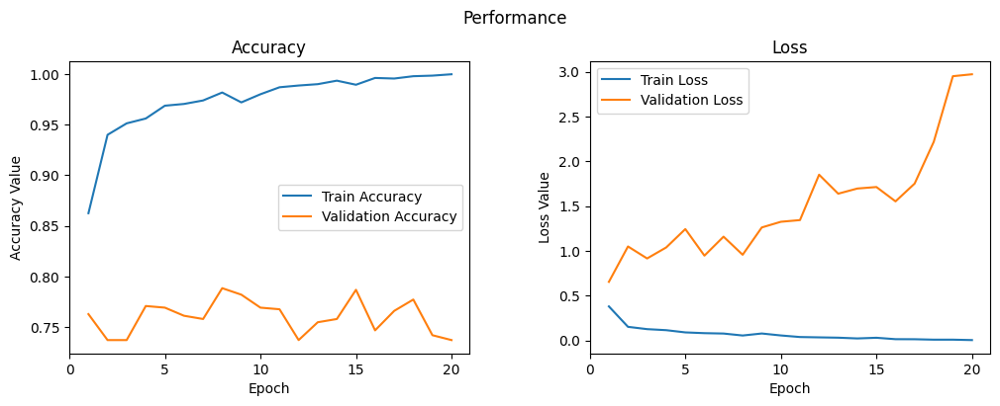

In [29]:
plotAccLoss(EPOCH, conv_np[0], conv_np[1], conv_np[2], conv_np[3])

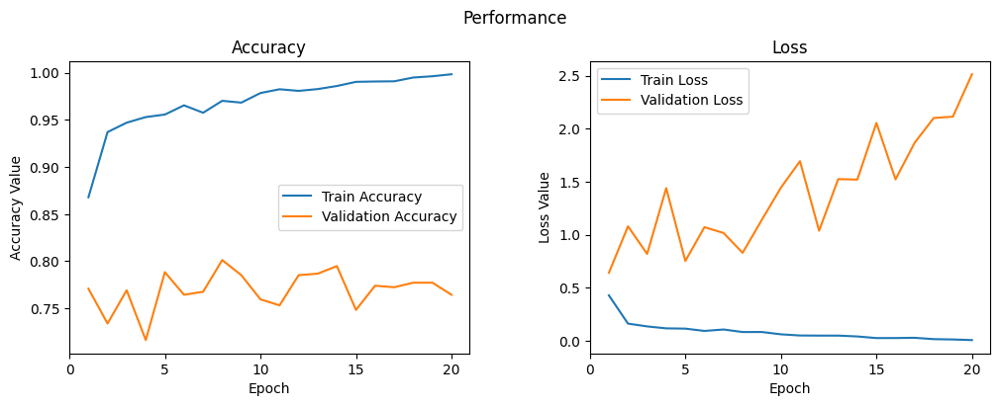

In [30]:
plotAccLoss(EPOCH, conv_avg_np[0], conv_avg_np[1], conv_avg_np[2], conv_avg_np[3])

> <span style="color:green"> Que ce soit le modèle simple ou le modèle avec un *average pooling*, l'apprentissage est médiocre : La ***Loss* augmente** beaucoup tandis que l'***accuracy* reste peu élevée**. Nous allons essayer de voir si le prétraitement de données peut avoir son importance dans ces résultats par la suite. Mais avant cela nous allons nous plonger plus dans le réseau réalisé.</span>

#### Analyses du modèle

In [31]:
def analyse_conv(model,img,nb_filtres=16):
    x  = img.unsqueeze(0).to(device)
    img_conv = []
    img_pool = []
    # Collecte des données sur les couches en forward = execution pas à pas des couches
    for m in model.features._modules.values(): # parcours des modules de features
        x = m.forward(x)
        if isinstance(m,nn.Conv2d): # pour les modules conv => les poids + la sortie
            img_conv.append((x.squeeze(0),m.weight))
        if isinstance(m,nn.MaxPool2d) or isinstance(m,nn.AvgPool2d): # pour le pooling, juste la sortie du module (pas de poids)
            img_pool.append(x.squeeze(0))
    
    # Partie d'affichage des données collectées
    plt.figure()
    plt.imshow(torch.squeeze(img.permute(1,2,0)).to('cpu'),cmap='gray') # input (~transpose en 3D)
    # nombre de filtres => affichage des données
    ksmax = min(nb_filtres, max([p[0].size(0) for p in img_conv]))
    fig, axs = plt.subplots(3*len(img_conv),ksmax,figsize=(20,5))
    for i,((img_c,w),img_p) in enumerate(zip(img_conv,img_pool)): # zip = hypothèse 1 conv <=> 1 pool
        # affichage Conv+result+pool => Toutes les 3 lignes
        for j in range(min(nb_filtres,img_c.size(0))): #Pour chacun des ici 16 filtres
            axs[3*i,j].imshow(np.array(w[j,0].to('cpu').detach()),cmap="gray") # indice = toutes les 3 lignes #les poids
            axs[3*i,j].axis('off')
            axs[3*i+1,j].imshow(np.array(img_c[j].to('cpu').detach()),cmap="gray")   #  image en sortie de la convolution                   
            axs[3*i+1,j].axis('off')
        for j in range(min(nb_filtres,img_p.size(0))):
            axs[3*i+2,j].imshow(np.array(img_p[j].to('cpu').detach()),cmap="gray") #image en sortie du pooling
            axs[3*i+2,j].axis('off')
    plt.show()

In [32]:
def getSaliency(model,img,label):
    model.zero_grad()
    img = img.to(device)
    img.requires_grad = True    # ajout du gradient sur l'image elle-même
                                # idée: + gd gradient = + fort impact sur la décision
    img.grad = None
    outputs = nn.Softmax(dim=1)(model(img.unsqueeze(0)))    # ATTENTION, le softmax est dans la loss, pas dans le réseau 
                                                            # => il faut le remettre à la main pour que ça marche
    output=outputs[0,label]     # focalisation sur la vérité terrain
    output.backward()           # calcul des gradients associés à cette classe seulement
    sal=img.grad.abs()          # récupération du gradient sur l'image (+abs)
    if sal.dim()>2:
        sal=torch.max(sal,dim=0)[0]
    fig=plt.figure(figsize=(8, 8))
    fig.add_subplot(1, 2, 1)
    plt.imshow(torch.squeeze(img.detach().cpu().permute(1,2,0)),cmap="gray")
    fig.add_subplot(1, 2, 2)
    plt.imshow(torch.squeeze(sal.to('cpu')),cmap="seismic",interpolation="bilinear")
    return sal

In [33]:
# Permet de mettre à  True/False tous les requires_grad des paramètres du réseau
def set_parameter_requires_grad(model,b):
    for p in model.parameters():
        p.requires_grad = b

#### Visualisation du CNN

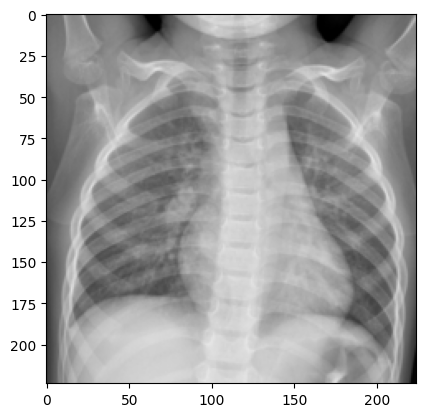

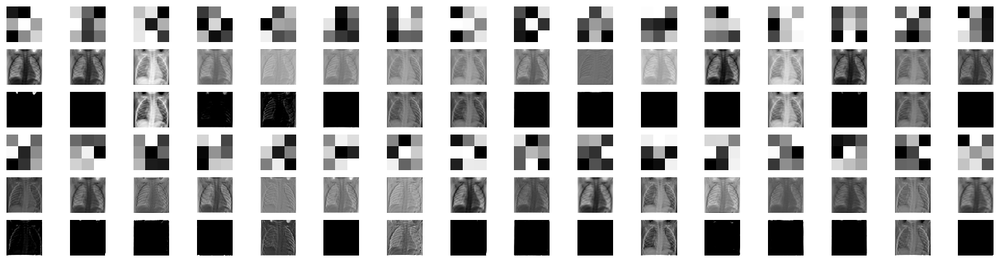

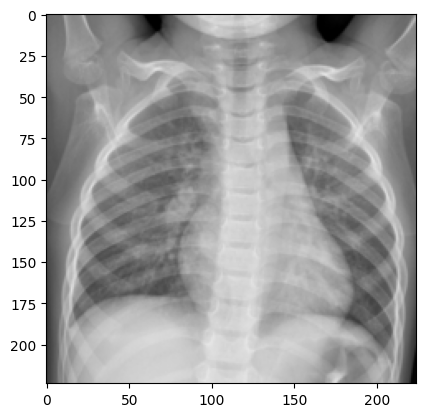

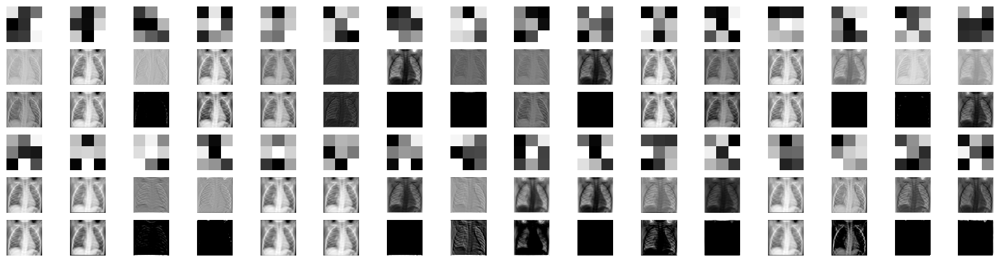

In [34]:
analyse_conv(convnet,train_dl.dataset[0][0]) 
analyse_conv(convnet_avg,train_dl.dataset[0][0])  

#### Saliency map

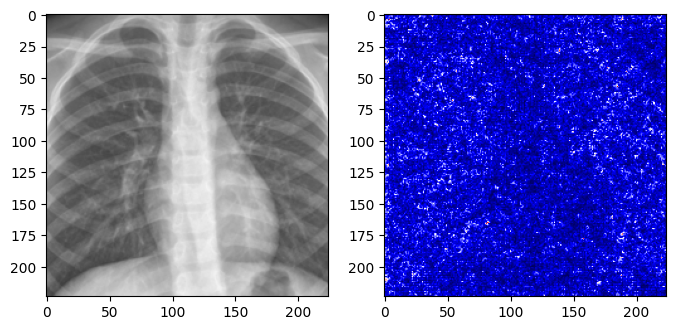

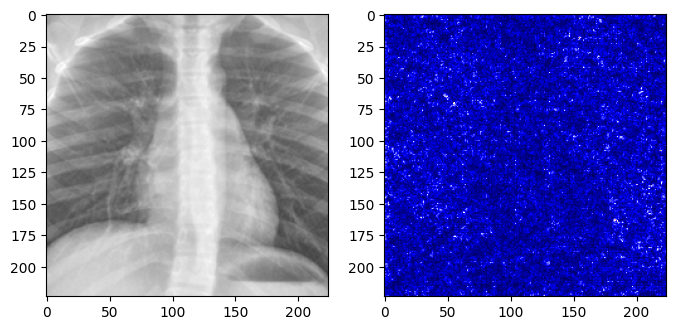

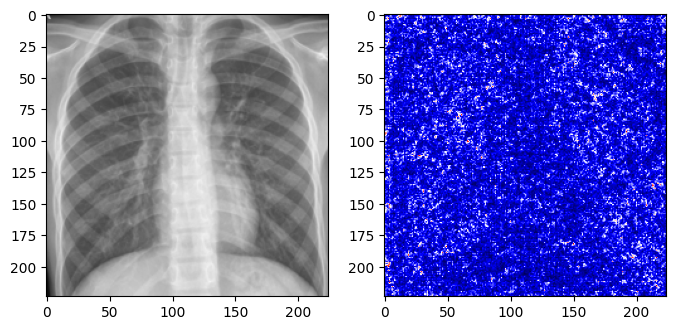

In [35]:
#Saliency map affichage (réseau 1)
for i in range(3):
    x,y = test_dl.dataset[i]
    getSaliency(convnet,x,y)

> <span style="color:green"> Ces illstrations tendent à confirmer les résultats précédente. Les image des la *saliency map* ne montrent pas de zones particulières sur lesquelles le réseau peut s'appuyer pour prendre la décision de classification. On voit notamment des points chauds sur les bords de l'image, hors des poumons. </span>

#### Amélioration du prétraitement des données

Passons maintenant à l'entrainement du réseau de neurone sur les données prétraitées (2) avec recadrage et *data augmentation*.

In [36]:
#Nouveau réseau qui sera entrainé sur les données avec prétraitement 2 
convnet_pt2 = ConvNet().to(device)
convnet_pt2.name="2ndConv-"+ time.asctime().replace(' ', '_').replace(':', '-')

In [37]:
#Entrainement
tensor_conv_pt2 = train(convnet_pt2,EPOCH, train_dl2,test_dl2)

running 2ndConv-Sat_Apr_15_14-51-24_2023


  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 0 :
TRAIN -    Loss 0.5851847529411316,      Accuracy 0.7766203703703703 


  5%|▌         | 1/20 [03:28<1:06:00, 208.45s/it]

TEST -    Loss 0.6015138626098633,      Accuracy 0.7740384615384616 
Epoch 1 :
TRAIN -    Loss 0.22710567712783813,      Accuracy 0.9076003086419753 


 10%|█         | 2/20 [06:58<1:02:52, 209.59s/it]

TEST -    Loss 0.5884256362915039,      Accuracy 0.7660256410256411 
Epoch 2 :
TRAIN -    Loss 0.1875857412815094,      Accuracy 0.9295910493827161 


 15%|█▌        | 3/20 [10:44<1:01:26, 216.85s/it]

TEST -    Loss 0.6084505915641785,      Accuracy 0.7884615384615384 
Epoch 3 :
TRAIN -    Loss 0.19390499591827393,      Accuracy 0.9232253086419753 


 20%|██        | 4/20 [14:16<57:18, 214.90s/it]  

TEST -    Loss 0.5888001322746277,      Accuracy 0.8060897435897436 
Epoch 4 :
TRAIN -    Loss 0.1770060807466507,      Accuracy 0.9317129629629629 


 25%|██▌       | 5/20 [17:51<53:45, 215.02s/it]

TEST -    Loss 0.6718013286590576,      Accuracy 0.7868589743589743 
Epoch 5 :
TRAIN -    Loss 0.1664268523454666,      Accuracy 0.9346064814814815 


 30%|███       | 6/20 [21:21<49:44, 213.21s/it]

TEST -    Loss 0.7935581207275391,      Accuracy 0.7740384615384616 
Epoch 6 :
TRAIN -    Loss 0.14786812663078308,      Accuracy 0.9430941358024691 


 35%|███▌      | 7/20 [24:50<45:54, 211.86s/it]

TEST -    Loss 0.7088203430175781,      Accuracy 0.7980769230769231 
Epoch 7 :
TRAIN -    Loss 0.16810540854930878,      Accuracy 0.9349922839506173 


 40%|████      | 8/20 [28:19<42:13, 211.10s/it]

TEST -    Loss 0.7984285354614258,      Accuracy 0.7772435897435898 
Epoch 8 :
TRAIN -    Loss 0.11985544860363007,      Accuracy 0.9540895061728395 


 45%|████▌     | 9/20 [31:48<38:35, 210.49s/it]

TEST -    Loss 0.7112796902656555,      Accuracy 0.7932692307692307 
Epoch 9 :
TRAIN -    Loss 0.14247411489486694,      Accuracy 0.9471450617283951 


 50%|█████     | 10/20 [35:22<35:14, 211.42s/it]

TEST -    Loss 0.7576180696487427,      Accuracy 0.7980769230769231 
Epoch 10 :
TRAIN -    Loss 0.15975725650787354,      Accuracy 0.9411651234567902 


 55%|█████▌    | 11/20 [38:57<31:51, 212.42s/it]

TEST -    Loss 0.9273093938827515,      Accuracy 0.7852564102564102 
Epoch 11 :
TRAIN -    Loss 0.1369975358247757,      Accuracy 0.9502314814814815 


 60%|██████    | 12/20 [42:29<28:20, 212.51s/it]

TEST -    Loss 0.7960677146911621,      Accuracy 0.7996794871794872 
Epoch 12 :
TRAIN -    Loss 0.1191483810544014,      Accuracy 0.9562114197530864 


 65%|██████▌   | 13/20 [46:05<24:54, 213.52s/it]

TEST -    Loss 0.6862896084785461,      Accuracy 0.8044871794871795 
Epoch 13 :
TRAIN -    Loss 0.13104727864265442,      Accuracy 0.9552469135802469 


 70%|███████   | 14/20 [49:35<21:14, 212.42s/it]

TEST -    Loss 0.9239932298660278,      Accuracy 0.782051282051282 
Epoch 14 :
TRAIN -    Loss 0.126417338848114,      Accuracy 0.9502314814814815 


 75%|███████▌  | 15/20 [53:10<17:46, 213.25s/it]

TEST -    Loss 1.0378011465072632,      Accuracy 0.7516025641025641 
Epoch 15 :
TRAIN -    Loss 0.11402123421430588,      Accuracy 0.9575617283950617 


 80%|████████  | 16/20 [56:47<14:17, 214.44s/it]

TEST -    Loss 0.7669495940208435,      Accuracy 0.8028846153846154 
Epoch 16 :
TRAIN -    Loss 0.12608975172042847,      Accuracy 0.9540895061728395 


 85%|████████▌ | 17/20 [1:00:28<10:49, 216.38s/it]

TEST -    Loss 0.8513237237930298,      Accuracy 0.7964743589743589 
Epoch 17 :
TRAIN -    Loss 0.11692680418491364,      Accuracy 0.9571759259259259 


 90%|█████████ | 18/20 [1:04:13<07:17, 218.84s/it]

TEST -    Loss 0.8178812861442566,      Accuracy 0.8012820512820513 
Epoch 18 :
TRAIN -    Loss 0.11213064938783646,      Accuracy 0.9608410493827161 


 95%|█████████▌| 19/20 [1:07:47<03:37, 217.51s/it]

TEST -    Loss 0.7314409017562866,      Accuracy 0.8157051282051282 
Epoch 19 :
TRAIN -    Loss 0.11003395169973373,      Accuracy 0.9560185185185185 


100%|██████████| 20/20 [1:11:25<00:00, 214.29s/it]

TEST -    Loss 0.6741036176681519,      Accuracy 0.8205128205128205 


In [38]:
#Enregistrement
# fichier = PATH+f"model/{convnet_pt2.name}"
# save_model(convnet_pt2,fichier)

convnet_pt2 = ConvNet().to(device)
convnet_pt2.name ="2ndConv-trained"

load_model("model/2ndConv-trained", convnet_pt2)

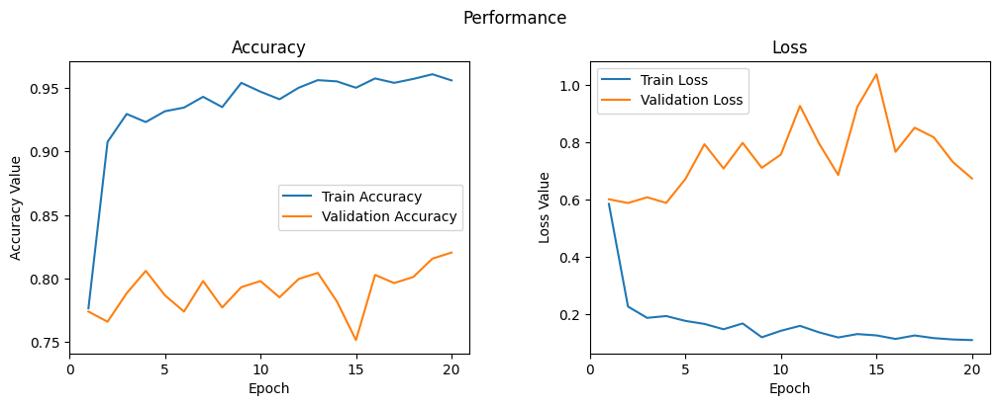

In [39]:
#Affichage des performances
conv_pt2_np = numpyConvert(tensor_conv_pt2)
plotAccLoss(EPOCH, conv_pt2_np[0], conv_pt2_np[1], conv_pt2_np[2], conv_pt2_np[3])

> <span style="color:green"> Cette fois, les résultats sont meilleurs. Même si l'augmentaion n'est que de quelques dizièmes par rapport au modèles précédents, l'***accuracy* est plus haute** (avec un maximum à 0.81). La ***loss***, quant à elle, **n'augmente plus** autant (même si elle ne diminue pas encore) et est plus faible que précédemment. </span>

On entraine cette fois le modèle avec les données normalisées.

In [40]:
#Nouveau réseau avec les prétraitement 3 (recadrage, data augmentation, normalisation)
convnet_pt3 = ConvNet().to(device)
convnet_pt3.name="3rdConv-"+ time.asctime().replace(' ', '_').replace(':', '-')

In [41]:
#Entrainement
tensor_conv_pt3 = train(convnet_pt3,EPOCH, train_dl3,test_dl3)

running 3rdConv-Sat_Apr_15_16-02-51_2023


  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 0 :
TRAIN -    Loss 0.5314028859138489,      Accuracy 0.8497299382716049 


  5%|▌         | 1/20 [03:32<1:07:25, 212.93s/it]

TEST -    Loss 0.6479247212409973,      Accuracy 0.7852564102564102 
Epoch 1 :
TRAIN -    Loss 0.15257854759693146,      Accuracy 0.9411651234567902 


 10%|█         | 2/20 [07:04<1:03:35, 211.96s/it]

TEST -    Loss 0.640202522277832,      Accuracy 0.7948717948717948 
Epoch 2 :
TRAIN -    Loss 0.15755869448184967,      Accuracy 0.9415509259259259 


 15%|█▌        | 3/20 [10:49<1:01:49, 218.22s/it]

TEST -    Loss 0.9058441519737244,      Accuracy 0.7467948717948718 
Epoch 3 :
TRAIN -    Loss 0.13237492740154266,      Accuracy 0.9508101851851852 


 20%|██        | 4/20 [14:17<57:02, 213.91s/it]  

TEST -    Loss 0.537317156791687,      Accuracy 0.8157051282051282 
Epoch 4 :
TRAIN -    Loss 0.1273280531167984,      Accuracy 0.951195987654321 


 25%|██▌       | 5/20 [17:48<53:14, 212.95s/it]

TEST -    Loss 1.0256584882736206,      Accuracy 0.7532051282051282 
Epoch 5 :
TRAIN -    Loss 0.10645588487386703,      Accuracy 0.9614197530864198 


 30%|███       | 6/20 [21:20<49:38, 212.76s/it]

TEST -    Loss 0.574681282043457,      Accuracy 0.8237179487179487 
Epoch 6 :
TRAIN -    Loss 0.10602658987045288,      Accuracy 0.9641203703703703 


 35%|███▌      | 7/20 [24:49<45:48, 211.39s/it]

TEST -    Loss 0.6697317957878113,      Accuracy 0.8092948717948718 
Epoch 7 :
TRAIN -    Loss 0.10556243360042572,      Accuracy 0.9598765432098766 


 40%|████      | 8/20 [28:24<42:29, 212.42s/it]

TEST -    Loss 0.6515847444534302,      Accuracy 0.8012820512820513 
Epoch 8 :
TRAIN -    Loss 0.10582538694143295,      Accuracy 0.9621913580246914 


 45%|████▌     | 9/20 [31:57<39:00, 212.80s/it]

TEST -    Loss 0.745256245136261,      Accuracy 0.7932692307692307 
Epoch 9 :
TRAIN -    Loss 0.10892032086849213,      Accuracy 0.9594907407407407 


 50%|█████     | 10/20 [35:34<35:40, 214.07s/it]

TEST -    Loss 0.6119232177734375,      Accuracy 0.7948717948717948 
Epoch 10 :
TRAIN -    Loss 0.09352593123912811,      Accuracy 0.9656635802469136 


 55%|█████▌    | 11/20 [39:12<32:18, 215.40s/it]

TEST -    Loss 0.8203840851783752,      Accuracy 0.8076923076923077 
Epoch 11 :
TRAIN -    Loss 0.10881184041500092,      Accuracy 0.9587191358024691 


 60%|██████    | 12/20 [42:46<28:39, 214.90s/it]

TEST -    Loss 0.7335749864578247,      Accuracy 0.7964743589743589 
Epoch 12 :
TRAIN -    Loss 0.09469585120677948,      Accuracy 0.9635416666666666 


 65%|██████▌   | 13/20 [46:28<25:18, 216.95s/it]

TEST -    Loss 0.9918755888938904,      Accuracy 0.782051282051282 
Epoch 13 :
TRAIN -    Loss 0.09241317212581635,      Accuracy 0.9652777777777778 


 70%|███████   | 14/20 [50:10<21:50, 218.48s/it]

TEST -    Loss 0.8106189370155334,      Accuracy 0.7900641025641025 
Epoch 14 :
TRAIN -    Loss 0.09697545319795609,      Accuracy 0.9621913580246914 


 75%|███████▌  | 15/20 [53:53<18:19, 219.82s/it]

TEST -    Loss 0.8800036907196045,      Accuracy 0.7852564102564102 
Epoch 15 :
TRAIN -    Loss 0.09047594666481018,      Accuracy 0.9625771604938271 


 80%|████████  | 16/20 [57:34<14:40, 220.24s/it]

TEST -    Loss 0.7690204381942749,      Accuracy 0.8044871794871795 
Epoch 16 :
TRAIN -    Loss 0.07341650128364563,      Accuracy 0.9720293209876543 


 85%|████████▌ | 17/20 [1:01:10<10:57, 219.06s/it]

TEST -    Loss 1.0051932334899902,      Accuracy 0.780448717948718 
Epoch 17 :
TRAIN -    Loss 0.07895275950431824,      Accuracy 0.9691358024691358 


 90%|█████████ | 18/20 [1:04:53<07:20, 220.06s/it]

TEST -    Loss 0.951618492603302,      Accuracy 0.780448717948718 
Epoch 18 :
TRAIN -    Loss 0.09428831189870834,      Accuracy 0.9652777777777778 


 95%|█████████▌| 19/20 [1:08:27<03:38, 218.27s/it]

TEST -    Loss 0.9214579463005066,      Accuracy 0.7916666666666666 
Epoch 19 :
TRAIN -    Loss 0.08178132027387619,      Accuracy 0.96875 


100%|██████████| 20/20 [1:12:04<00:00, 216.22s/it]

TEST -    Loss 0.9720472693443298,      Accuracy 0.7596153846153846 


In [42]:
#Enregistrement
# fichier = PATH+f"model/{convnet_pt3.name}"
# save_model(convnet_pt3,fichier)

convnet_pt3 = ConvNet().to(device)
convnet_pt3.name ="3rdConv-trained"

load_model("model/3rdConv-trained", convnet_pt3)

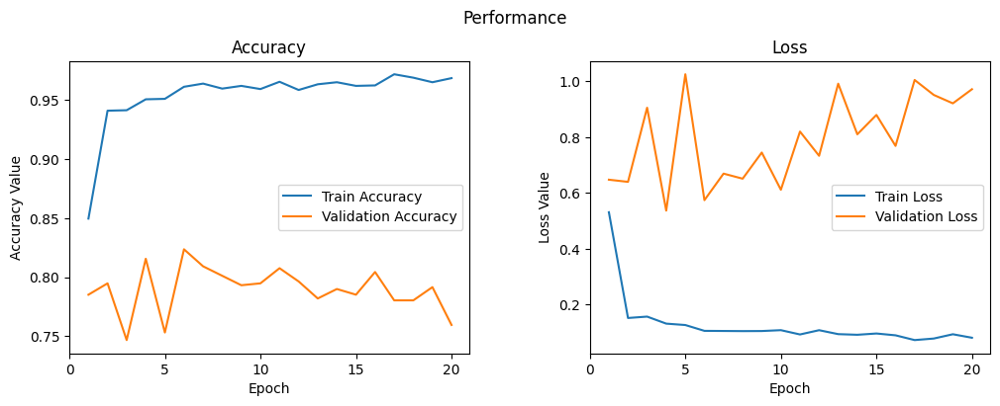

In [43]:
#Affichage des performances en entrainement et en test
conv_pt3_np = numpyConvert(tensor_conv_pt3)
plotAccLoss(EPOCH, conv_pt3_np[0], conv_pt3_np[1], conv_pt3_np[2], conv_pt3_np[3])

> <span style="color:green"> Avec les données normalisées les résultats sont comparables aux résultats précédents (les courbes *accuracy* et *loss* sont cependant moins stable et  l'effet d'apprentissage, soit une augmentation de l'*accuracy* et une diminution de la *loss*, sont moins visibles que pour le modèle précédent).</span>

> <span style="color:green"> Par ailleurs, nous n'avons pas encore evoqué les **courbes d'entrainement**. Pour tous les modèles vus précédemment, la courbe d'***accuracy* d'entrainement** augmente très vite et semble atteindre un plateau vers 0.97 (entre 15 et 20 itérations). De la même manière, la courbe de la ***loss* d'entrainement** diminue très vite au début, puis stagne très faible vers la 10ème itération. Les performances du modèle auront dont du mal à augmenter en généralisation.</span>

#### Amélioration possible du modèle

> <span style="color:green"> Pour tenter d'améliorer le réseau précédent nous avons appliqué de la ***batch normalization*** après chaque **couche entièrement connectée** pour normaliser leurs activations ce qui a pour but d'améliorer la stabilité et la convergence du réseau, et donc éviter l'augmentation de la *loss* observée précédemmment. Par ailleurs, nous avions aussi vu que les courbes d'entrainement atteignaient très vite un plafond très haut et ne bougeaient presque plus, ce qui peut mener à du **surapprentissage**. Pour l'éviter et améliorer la généralisation, nous avons aussi ajouté un ***dropout***  pour désactiver aléatoirement certains noeuds du réseau pendant de l'entraînement. </span>

In [44]:
## Modification du réseau 
set_parameter_requires_grad(convnet_pt2,False) # on repart de convnet
convnet_pt2.name="5thConv-"+ time.asctime().replace(' ', '_').replace(':', '-')
convnet_pt2.features.add_module("conv3", nn.Sequential( nn.Conv2d(32, 64, 3, padding=1), nn.ReLU(),nn.MaxPool2d(2,2)))
convnet_pt2.size = 64*28*28
convnet_pt2.classifier = nn.Sequential(torch.nn.Linear(64*28*28, 120), torch.nn.BatchNorm1d(120), torch.nn.ReLU(), torch.nn.Dropout(p=0.2),
                                    torch.nn.Linear(120, 60), torch.nn.BatchNorm1d(60), torch.nn.ReLU(), torch.nn.Dropout(p=0.2),
                                    torch.nn.Linear(60, 2), torch.nn.BatchNorm1d(2))

In [45]:
inputs, _ = next(iter(train_dl2))

# Affichage de la forme du tenseur d'entrée
print(inputs.size()[1:]) 

torch.Size([3, 224, 224])


In [46]:
#Résumé du réseau construit
summary(convnet_pt2, (3,224,224), 64)

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [64, 16, 224, 224]             448
            Conv2d-2         [64, 16, 224, 224]             448
              ReLU-3         [64, 16, 224, 224]               0
         MaxPool2d-4         [64, 16, 112, 112]               0
         MaxPool2d-5         [64, 16, 112, 112]               0
            Conv2d-6         [64, 32, 112, 112]           4,640
            Conv2d-7         [64, 32, 112, 112]           4,640
              ReLU-8         [64, 32, 112, 112]               0
         MaxPool2d-9           [64, 32, 56, 56]               0
        MaxPool2d-10           [64, 32, 56, 56]               0
           Conv2d-11           [64, 64, 56, 56]          18,496
             ReLU-12           [64, 64, 56, 56]               0
        MaxPool2d-13           [64, 64, 28, 28]               0
           Linear-14                  [

Nous avons ensuite entrainé ce réseau sur les données prétraitées (2).

In [47]:
# Entrainement
tensor_conv_pt2_bis = train(convnet_pt2,10,train_dl2,test_dl2)

running 5thConv-Sat_Apr_15_17-14-57_2023


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch 0 :
TRAIN -    Loss 0.2626187205314636,      Accuracy 0.9207175925925926 


 10%|█         | 1/10 [03:02<27:22, 182.54s/it]

TEST -    Loss 0.5712206959724426,      Accuracy 0.7323717948717948 
Epoch 1 :
TRAIN -    Loss 0.2010572999715805,      Accuracy 0.9463734567901234 


 20%|██        | 2/10 [06:02<24:09, 181.13s/it]

TEST -    Loss 0.5247763991355896,      Accuracy 0.7532051282051282 
Epoch 2 :
TRAIN -    Loss 0.18919163942337036,      Accuracy 0.9461805555555556 


 30%|███       | 3/10 [09:07<21:19, 182.80s/it]

TEST -    Loss 0.5518847703933716,      Accuracy 0.7163461538461539 
Epoch 3 :
TRAIN -    Loss 0.18211300671100616,      Accuracy 0.9473379629629629 


 40%|████      | 4/10 [12:04<18:02, 180.40s/it]

TEST -    Loss 0.7776572108268738,      Accuracy 0.6778846153846154 
Epoch 4 :
TRAIN -    Loss 0.16270650923252106,      Accuracy 0.9554398148148148 


 50%|█████     | 5/10 [15:04<15:01, 180.40s/it]

TEST -    Loss 0.6177660822868347,      Accuracy 0.7403846153846154 
Epoch 5 :
TRAIN -    Loss 0.15078765153884888,      Accuracy 0.9600694444444444 


 60%|██████    | 6/10 [18:08<12:06, 181.51s/it]

TEST -    Loss 0.7861762642860413,      Accuracy 0.6057692307692307 
Epoch 6 :
TRAIN -    Loss 0.13345906138420105,      Accuracy 0.9635416666666666 


 70%|███████   | 7/10 [21:05<09:00, 180.06s/it]

TEST -    Loss 0.4832425117492676,      Accuracy 0.7948717948717948 
Epoch 7 :
TRAIN -    Loss 0.14984780550003052,      Accuracy 0.9537037037037037 


 80%|████████  | 8/10 [24:06<06:00, 180.29s/it]

TEST -    Loss 0.7627663612365723,      Accuracy 0.7003205128205128 
Epoch 8 :
TRAIN -    Loss 0.12773358821868896,      Accuracy 0.9631558641975309 


 90%|█████████ | 9/10 [27:08<03:00, 180.90s/it]

TEST -    Loss 0.8616668581962585,      Accuracy 0.6666666666666666 
Epoch 9 :
TRAIN -    Loss 0.12279213964939117,      Accuracy 0.9637345679012346 


100%|██████████| 10/10 [30:07<00:00, 180.77s/it]

TEST -    Loss 1.1494516134262085,      Accuracy 0.6602564102564102 


In [48]:
# fichier = PATH+f"model/{convnet_pt2.name}"
# save_model(convnet_pt2,fichier)

convnet_pt2 = ConvNet().to(device)
convnet_pt2.name ="4thConv-trained"

load_model("model/4thConv-trained", convnet_pt2)

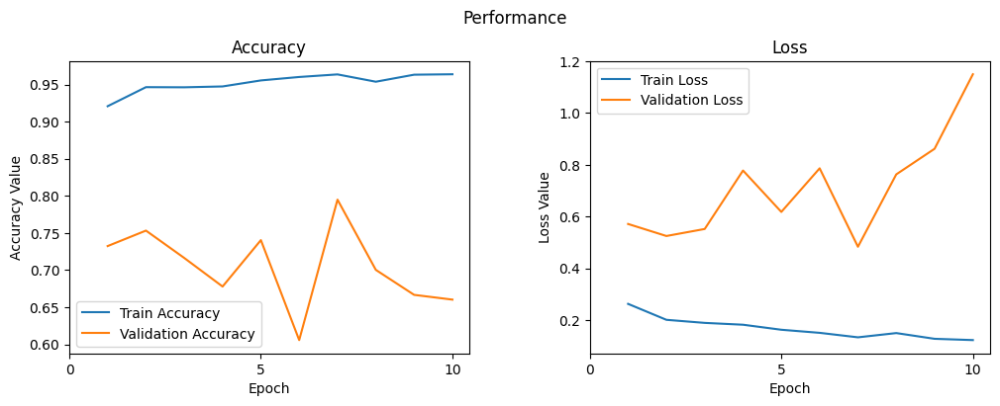

In [49]:
conv5_np = numpyConvert(tensor_conv_pt2_bis)
plotAccLoss(10, conv5_np[0], conv5_np[1], conv5_np[2], conv5_np[3])

> <span style="color:green"> Cette fois-ci on observe un **apprentissage** : une **agmentation de l'*accuracy*** et une stablisation ainsi qu'une une **diminution de la *loss***. Cependant la valeur finale change assez peu des deux modèles précédents (entrainés sur les mêmes données prétraitées). Pour améliorer les performances de ce réseau à l'avenir, il faudra peut être changer les couches de convolution (leur nombre, les traitements entre chaque couche et les paramètres) pour extraires de meilleures caractéristiques des images et, de ce fait, faciliter la classification qui suit. </span>

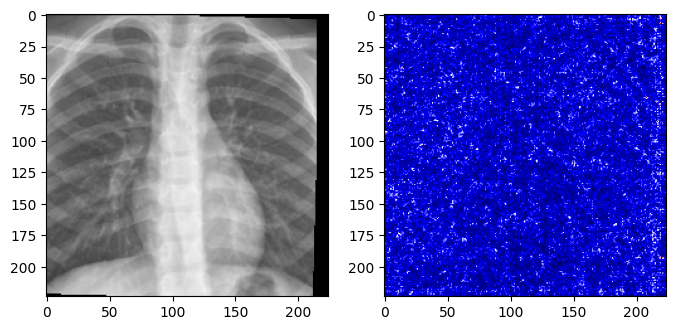

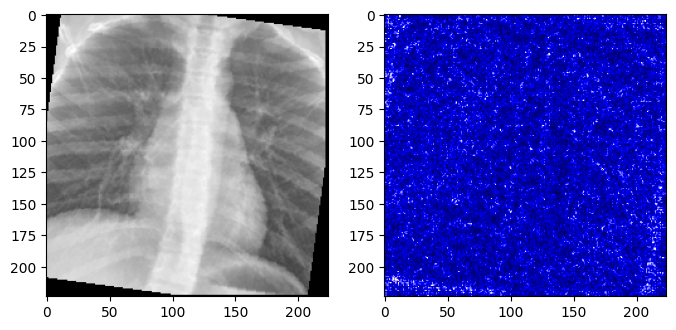

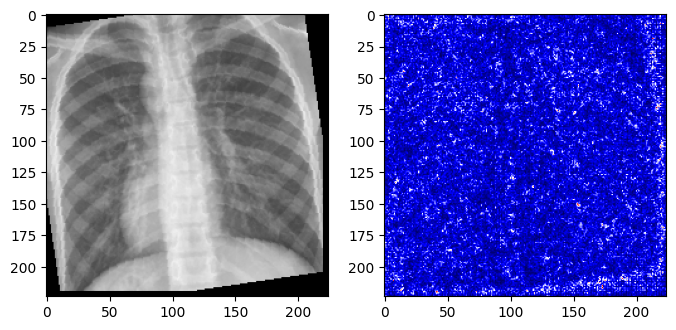

In [50]:
for i in range(3):
    x,y = test_dl2.dataset[i]
    getSaliency(convnet_pt2,x,y)

La différence avec le premier modèle n'est pas évidente mais on observe tout de même une tendance : On peut remarquer la forme de la colonne vertebrale en foncé au milieu ainsi que le coeur. cela signifie que le réseau convolutionnel s'appuie peu sur ces zones et plus sur les poumons pour prendre sa décision de classification ce que semble plus cohérent que les *saliency map* précédentes. Cependant, des zones telles que celles en dessous du diaphragme  et les bords de l'image participent ici à la décision sur l'image  et  alors qu'elles ne devraient pas.

### 3. Evaluation du modèle

#### Comparaison des différents modèles (notamment avec le modèle amélioré)

Nous allons donc baser notre conclusion sur le dernier modèle présenté (convnet3), entrainé sur les données prétraitées (*data augmentation* et recadrage) et avec des couches supplémentaires pour la partie classification, qui a l'*accuracy* finale la plus haute (0.815).

#### Prédiction sur les données de validation

In [51]:
print(dataset_val2.class_to_idx)

{'NORMAL': 0, 'PNEUMONIA': 1}


In [52]:
#Prédiction de la classe d'échantillons

def getClass(model,img,label):
    model.eval()
    with torch.no_grad():
        output = model(img.unsqueeze(0))

    # Appliquer une fonction de seuillage pour convertir la sortie en une classe binaire
    probs = nn.Softmax(dim=1)(output) 
    print(probs)
    _, predicted = torch.max(output, 1)
    prediction = torch.round(torch.sigmoid(predicted)).item()
    
    return predicted.item()


In [53]:
#Plot d'un echantillon d'exemples (fonction)

def plot_prediction(images, labels, preds):  
    fig, ax = plt.subplots(nrows=3, ncols=5, figsize=(30,20))
    for i in range(len(images)):
        img = images[i] #cv2.cvtColor(imread(images[i]), cv2.COLOR_BGR2RGB)
        ax[i//5][i%5].imshow(torch.squeeze(img.detach().cpu().permute(1,2,0)),cmap="gray")
        if labels[i]==0 and preds[i]==0:
            ax[i//5][i%5].set_title("Label : 'Normal'\nPrédit : 'Normal'", fontsize=20)
        elif labels[i]==0 and preds[i]==1:
            ax[i//5][i%5].set_title("Label : 'Normal'\nPrédit : 'Pneumonia'", fontsize=20)
        elif labels[i]==1 and preds[i]==1:
            ax[i//5][i%5].set_title("Label : 'Pneumonia'\nPrédit : 'Pneumonia'", fontsize=20)
        else:
            ax[i//5][i%5].set_title("Label : 'Pneumonia'\nPrédit : 'Normal'", fontsize=20)
        ax[i//5][i%5].axis('off')

tensor([[0.5008, 0.4992]])
tensor([[0.5006, 0.4994]])
tensor([[0.5022, 0.4978]])
tensor([[0.5053, 0.4947]])
tensor([[0.5018, 0.4982]])
tensor([[0.4997, 0.5003]])
tensor([[0.5056, 0.4944]])
tensor([[0.5066, 0.4934]])
tensor([[0.4992, 0.5008]])
tensor([[0.5039, 0.4961]])
tensor([[0.5064, 0.4936]])
tensor([[0.5029, 0.4971]])
tensor([[0.5062, 0.4938]])
tensor([[0.5023, 0.4977]])
tensor([[0.5027, 0.4973]])


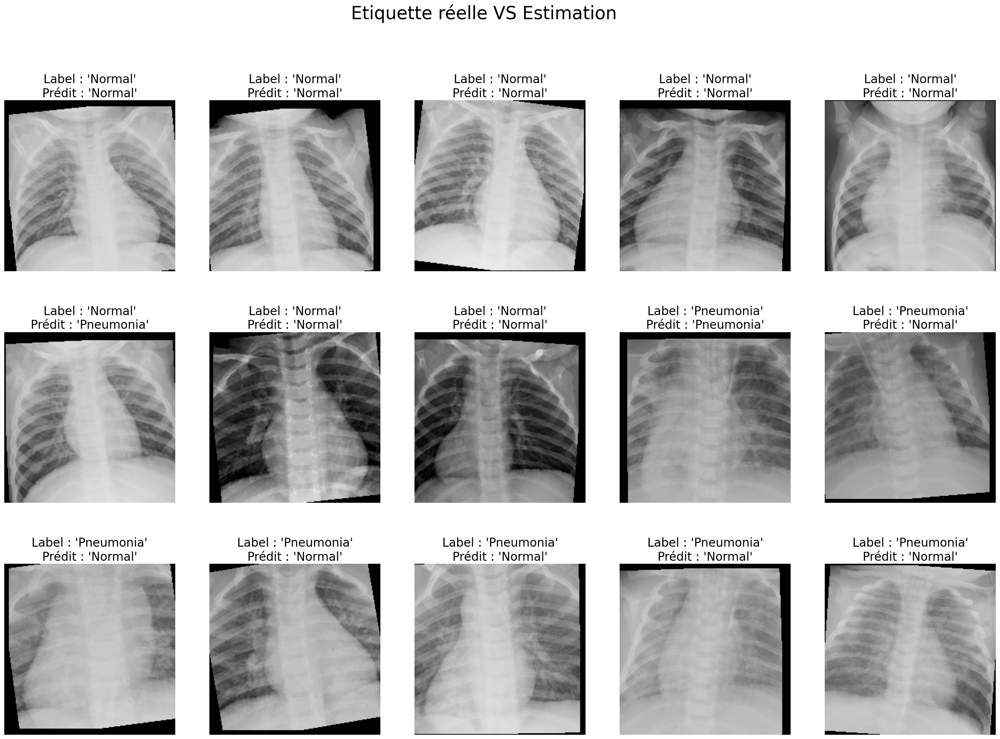

In [62]:

yhat = []
images = []
lab = []
for i in range(len(dataset_val2)-1):
    x,y = val_dl2.dataset[i]
    images.append(x)
    lab.append(y)
    yhat.append(getClass(convnet_pt2,x,y))
    

plot_prediction(images, lab, yhat)
plt.suptitle("Etiquette réelle VS Estimation", fontsize=30)
plt.show()

#### Métriques d'évaluation

<Figure size 640x480 with 0 Axes>

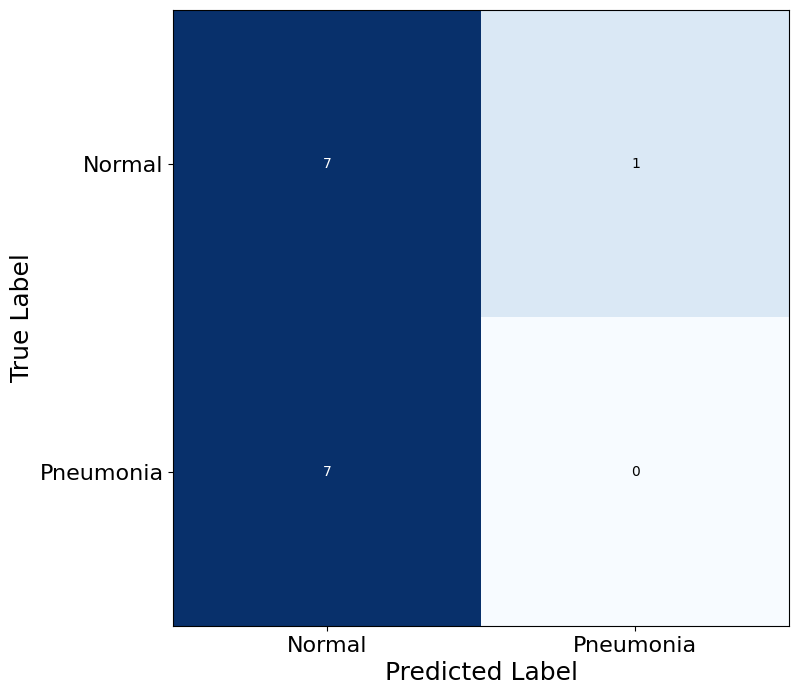

In [55]:
# Plot confusion matrix
cm  = confusion_matrix(lab, yhat)
plt.figure()
plot_confusion_matrix(cm,figsize=(12,8),cmap=plt.cm.Blues)
plt.xticks(range(2), ['Normal', 'Pneumonia'], fontsize=16)
plt.yticks(range(2), ['Normal', 'Pneumonia'], fontsize=16)
plt.xlabel('Predicted Label',fontsize=18)
plt.ylabel('True Label',fontsize=18)
plt.show()


In [63]:
# calcule des metriques de performance
tn, fp, fn, tp = cm.ravel()

accuracy_ = (np.array(yhat) == np.array(lab)).sum() / len(yhat)
precision_ = tp/(tp+fp)
recall_ = tp/(tp+fn)
f1_ = 2*((precision_*recall_)/(precision_+recall_))

print("Accuracy of the model is {:.2f}".format(accuracy_))
print("Recall of the model is {:.2f}".format(recall_))
print("Precision of the model is {:.2f}".format(precision_))
print("F1 Score of the model is {:.2f}".format(f1_))

Accuracy of the model is 0.53
Recall of the model is 0.00
Precision of the model is 0.00
F1 Score of the model is nan


C:\Users\judit\AppData\Local\Temp\ipykernel_14632\4084234283.py:7: RuntimeWarning: invalid value encountered in scalar divide
  f1_ = 2*((precision_*recall_)/(precision_+recall_))


Ces résultats sont peu concluants et fluctuent beaucoup d'un entrainement du réseau à l'autre. Ils sont ici juste à titre indicatifs pour illustrer les prédictions du réseau à convolution construit. Ils proviennent d'un petit jeu de données et pour faire des conclusions plus robustes, il faudrait faire ces calculs sur un plus grand nombre d'exemples. Cela permettrait notammment d'ajuster les poids accordés à chaque classe au début qui semblent jouer un rôle non négligeable dans les prédictions finales. 

> <span style="color:green"> Dans le cadre médical, on pourrait par exemple accorder plus de poids à la `pneumonie` pour être certain de la détecter, en s'accordant le droit de faire quelques erreurs **Faux positif** (axer ses performances sur le **rappel** et moins sur la **précision**).</span>

### 4. Conclusion


> <span style="color:green"> Pour conclure, les résultats du réseaux sont instables et les performances restent à être améliorées. Il existe cependant des modèles tels que celui-ci qui montrent des performances interessantes. Certains d'entre eux s'appuient notamment sur du ***transfer learning*** qui permet de partir d'un modèle pré-entrainé sur une tâche comparable de classification d'image et de l'entrainer pour l'adapter à la tâche de détection de la pneumonie. </span>